In [1]:
import pandas as pd

In [2]:
df = pd.read_csv(r'C:\Users\Shin\Desktop\for-kr-pjt\NoonMap-Project\data\file_data\병합DB_2차.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7457002 entries, 0 to 7457001
Data columns (total 14 columns):
 #   Column              Dtype  
---  ------              -----  
 0   Unnamed: 0          int64  
 1   bridge_name         object 
 2   address             object 
 3   etc_address         object 
 4   latitude            float64
 5   longitude           float64
 6   brid_height_origin  float64
 7   location_start      object 
 8   wl_station_code     int64  
 9   station_name        object 
 10  location            object 
 11  obs_date            object 
 12  WL                  float64
 13  bridge_height       float64
dtypes: float64(5), int64(2), object(7)
memory usage: 796.5+ MB


In [4]:
df['obs_date'] = pd.to_datetime(df['obs_date'])

In [5]:
bridge_list = pd.unique(df['location_start']).tolist()

In [6]:
len(bridge_list)

86

In [10]:
# 교량을 기준으로 데이터프레임 분리
df_list = [df[df['location_start']==i] for i in bridge_list]

In [11]:
# 불필요한 열 제거, 날짜순으로 정렬 뒤 인덱스 재설정
for i in range(len(bridge_list)):
    df_list[i] = df_list[i].drop(columns=['Unnamed: 0', 'bridge_name', 'address', 'etc_address', 'latitude', 'longitude',
                                           'brid_height_origin', 'location_start', 'wl_station_code', 'station_name',
                                           'location', 'bridge_height'])
    df_list[i].sort_values(['obs_date'], inplace=True)
    df_list[i].reset_index(drop=True, inplace=True)
    df_list[i].rename({'obs_date':'time', 'WL':'value'}, axis=1, inplace=True)

In [12]:
df_list[0]

,time,value
0,2016-11-09 01:00:00,145.0
1,2016-11-09 02:00:00,145.0
2,2016-11-09 03:00:00,145.0
3,2016-11-09 04:00:00,146.0
4,2016-11-09 05:00:00,146.0
...,...,...
33252,2020-08-26 21:00:00,198.0
33253,2020-08-26 22:00:00,200.0
33254,2020-08-26 23:00:00,202.0
33255,2020-08-27 00:00:00,204.0


In [13]:
import matplotlib.pyplot as plt

In [14]:
import numpy as np

In [15]:
from datetime import datetime 

In [16]:
from sklearn.model_selection import train_test_split

In [17]:
# 각 데이터프레임마다 test data의 비율이 0.5가 되도록 설정
split_date = []
for i in range(len(df_list)):
    idx = len(train_test_split(df_list[i], test_size=.5)[0])
    split_date.append(df_list[i]['time'][idx])

In [18]:
split_date

[Timestamp('2018-10-03 06:00:00'),
 Timestamp('2015-04-28 17:00:00'),
 Timestamp('2018-04-15 14:00:00'),
 Timestamp('2018-04-15 14:00:00'),
 Timestamp('2016-08-18 06:00:00'),
 Timestamp('2019-02-17 06:00:00'),
 Timestamp('2015-07-26 07:00:00'),
 Timestamp('2015-05-24 22:00:00'),
 Timestamp('2015-03-19 23:00:00'),
 Timestamp('2015-04-27 00:00:00'),
 Timestamp('2015-04-27 00:00:00'),
 Timestamp('2018-06-05 01:00:00'),
 Timestamp('2015-07-11 19:00:00'),
 Timestamp('2015-12-26 01:00:00'),
 Timestamp('2015-04-29 21:00:00'),
 Timestamp('2015-04-26 09:00:00'),
 Timestamp('2015-05-21 10:00:00'),
 Timestamp('2017-04-27 14:00:00'),
 Timestamp('2018-10-03 07:00:00'),
 Timestamp('2015-04-17 09:00:00'),
 Timestamp('2015-04-30 08:00:00'),
 Timestamp('2019-12-03 14:00:00'),
 Timestamp('2015-09-04 04:00:00'),
 Timestamp('2015-06-20 20:00:00'),
 Timestamp('2017-04-27 18:00:00'),
 Timestamp('2015-10-30 20:00:00'),
 Timestamp('2015-05-26 16:00:00'),
 Timestamp('2015-11-15 16:00:00'),
 Timestamp('2015-04-

In [19]:
train_value = [df_list[i][df_list[i]['time'] < split_date[i]]['value'] for i in range(len(df_list))]

In [20]:
test_value = [df_list[i][df_list[i]['time'] >= split_date[i]]['value'] for i in range(len(df_list))]

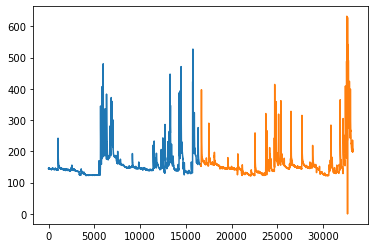

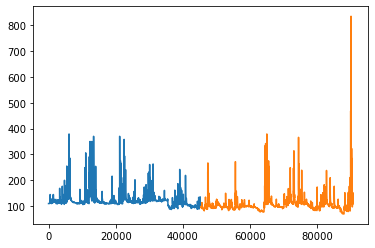

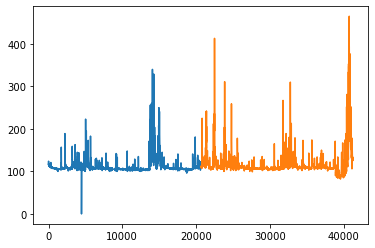

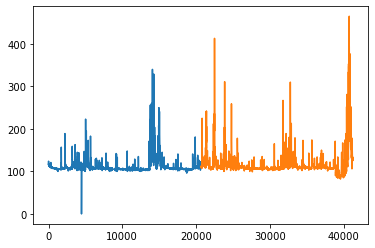

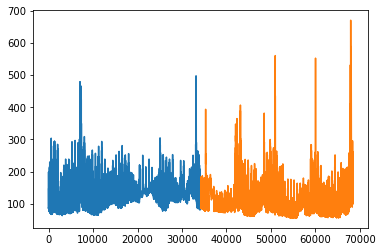

...

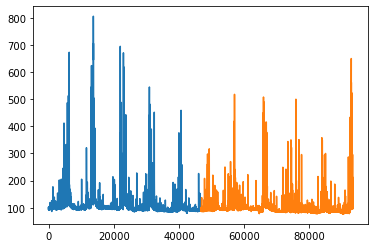

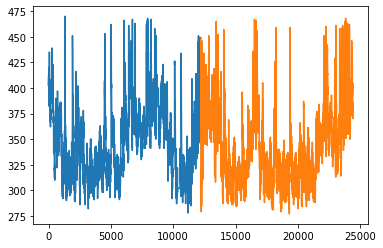

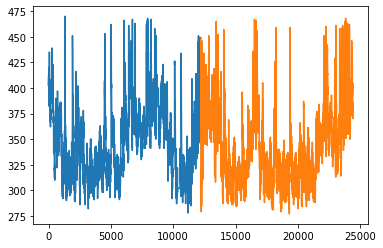

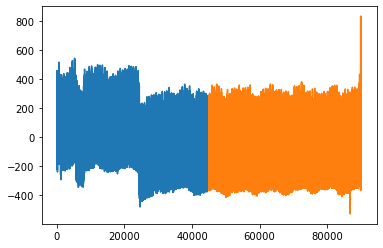

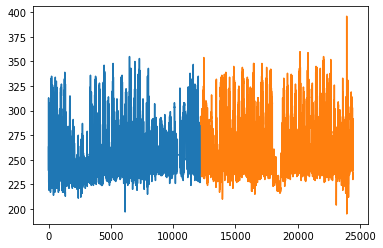

In [21]:
# 파란색 그래프: train data, 노란색 그래프: test data
for i in range(len(df_list)):
    ax = train_value[i].plot()
    test_value[i].plot(ax=ax)
    plt.show()

In [22]:
from sklearn.preprocessing import MinMaxScaler

In [23]:
sc = [MinMaxScaler() for i in range(len(df_list))]

In [24]:
train_arr = [np.array(train_value[i]).reshape(-1,1) for i in range(len(df_list))]

In [25]:
test_arr = [np.array(test_value[i]).reshape(-1,1) for i in range(len(df_list))]

In [26]:
train_sc = [sc[i].fit_transform(train_arr[i]) for i in range(len(df_list))]
test_sc = [sc[i].transform(test_arr[i]) for i in range(len(df_list))]

In [27]:
train_sc[0]

array([[0.05445545],
       [0.05445545],
       [0.05445545],
       ...,
       [0.07920792],
       [0.07920792],
       [0.07920792]])

In [28]:
train = [df_list[i][df_list[i]['time'] < split_date[i]] for i in range(len(df_list))]
test = [df_list[i][df_list[i]['time'] >= split_date[i]] for i in range(len(df_list))]

In [29]:
for i in range(len(df_list)):
    train[i] = train[i].set_index('time')
    test[i] = test[i].set_index('time')

In [30]:
train[0].head(10)

,value
time,
2016-11-09 01:00:00,145.0
2016-11-09 02:00:00,145.0
2016-11-09 03:00:00,145.0
2016-11-09 04:00:00,146.0
2016-11-09 05:00:00,146.0
2016-11-09 06:00:00,146.0
2016-11-09 07:00:00,146.0
2016-11-09 08:00:00,146.0
2016-11-09 09:00:00,146.0


In [31]:
train_sc_df = [pd.DataFrame(train_sc[i], columns=['std_value'], index=train[i].index) for i in range(len(df_list))]
test_sc_df = [pd.DataFrame(test_sc[i], columns=['std_value'], index=test[i].index)for i in range(len(df_list))]

In [32]:
train_sc_df[0].head(10)

,std_value
time,
2016-11-09 01:00:00,0.054455
2016-11-09 02:00:00,0.054455
2016-11-09 03:00:00,0.054455
2016-11-09 04:00:00,0.056931
2016-11-09 05:00:00,0.056931
2016-11-09 06:00:00,0.056931
2016-11-09 07:00:00,0.056931
2016-11-09 08:00:00,0.056931
2016-11-09 09:00:00,0.056931


In [33]:
for i in range(len(df_list)):
    train[i]['std_value'] = train_sc_df[i]['std_value']
    test[i]['std_value'] = test_sc_df[i]['std_value']
    train[i].drop(['value'], axis=1, inplace=True)
    test[i].drop(['value'], axis=1, inplace=True)

In [34]:
train[0].head(10)

,std_value
time,
2016-11-09 01:00:00,0.054455
2016-11-09 02:00:00,0.054455
2016-11-09 03:00:00,0.054455
2016-11-09 04:00:00,0.056931
2016-11-09 05:00:00,0.056931
2016-11-09 06:00:00,0.056931
2016-11-09 07:00:00,0.056931
2016-11-09 08:00:00,0.056931
2016-11-09 09:00:00,0.056931


In [35]:
for i in range(len(df_list)):
    for s in range(12):
        train[i]['shift_{}'.format(s)] = train[i]['std_value'].shift(s)
        test[i]['shift_{}'.format(s)] = test[i]['std_value'].shift(s)

In [36]:
train[0].head()

,std_value,shift_0,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11
time,,,,,,,,,,,,,
2016-11-09 01:00:00,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-09 02:00:00,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-09 03:00:00,0.054455,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-09 04:00:00,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-09 05:00:00,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
X_train = [train[i].dropna().drop('std_value', axis=1) for i in range(len(df_list))]
y_train = [train[i].dropna()[['std_value']] for i in range(len(df_list))]
X_test = [test[i].dropna().drop('std_value', axis=1) for i in range(len(df_list))]
y_test = [test[i].dropna()[['std_value']] for i in range(len(df_list))]

In [38]:
X_train[0].head()

,shift_0,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11
time,,,,,,,,,,,,
2016-11-09 12:00:00,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455
2016-11-09 13:00:00,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455
2016-11-09 14:00:00,0.054455,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455
2016-11-09 15:00:00,0.054455,0.054455,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931
2016-11-09 16:00:00,0.054455,0.054455,0.054455,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931


In [39]:
y_train[0].head(10)

,std_value
time,
2016-11-09 12:00:00,0.054455
2016-11-09 13:00:00,0.054455
2016-11-09 14:00:00,0.054455
2016-11-09 15:00:00,0.054455
2016-11-09 16:00:00,0.054455
2016-11-09 17:00:00,0.054455
2016-11-09 18:00:00,0.054455
2016-11-09 19:00:00,0.051980
2016-11-09 20:00:00,0.054455


In [40]:
print(type(X_train[0]))

<class 'pandas.core.frame.DataFrame'>


In [41]:
X_train = [X_train[i].values for i in range(len(df_list))]
print(type(X_train[0]))

<class 'numpy.ndarray'>


In [42]:
X_test= [X_test[i].values for i in range(len(df_list))]
y_train = [y_train[i].values for i in range(len(df_list))]
y_test = [y_test[i].values for i in range(len(df_list))]

In [43]:
print(X_train[0].shape)
print(y_train[0].shape)

(16617, 12)
(16617, 1)


In [44]:
X_train_t = [X_train[i].reshape(X_train[i].shape[0], 12, 1) for i in range(len(df_list))]
X_test_t = [X_test[i].reshape(X_test[i].shape[0], 12, 1) for i in range(len(df_list))]

In [45]:
print('최종 data')
for i in range(len(df_list)):
    print('dataframe index: ', i)
    print(X_train_t[i].shape)
    print(X_test_t[i].shape)

최종 data
dataframe index:  0
(16617, 12, 1)
(16618, 12, 1)
dataframe index:  1
(45308, 12, 1)
(45308, 12, 1)
dataframe index:  2
(20625, 12, 1)
(20625, 12, 1)
dataframe index:  3
(20625, 12, 1)
(20625, 12, 1)
dataframe index:  4
(34202, 12, 1)
(34203, 12, 1)
dataframe index:  5
(13329, 12, 1)
(13330, 12, 1)
dataframe index:  6
(43923, 12, 1)
(43923, 12, 1)
dataframe index:  7
(45347, 12, 1)
(45348, 12, 1)
dataframe index:  8
(41980, 12, 1)
(41980, 12, 1)
dataframe index:  9
(46353, 12, 1)
(46353, 12, 1)
dataframe index:  10
(46353, 12, 1)
(46353, 12, 1)
dataframe index:  11
(12867, 12, 1)
(12867, 12, 1)
dataframe index:  12
(44301, 12, 1)
(44301, 12, 1)
dataframe index:  13
(40847, 12, 1)
(40848, 12, 1)
dataframe index:  14
(46643, 12, 1)
(46643, 12, 1)
dataframe index:  15
(39596, 12, 1)
(39597, 12, 1)
dataframe index:  16
(40567, 12, 1)
(40567, 12, 1)
dataframe index:  17
(29177, 12, 1)
(29177, 12, 1)
dataframe index:  18
(16618, 12, 1)
(16618, 12, 1)
dataframe index:  19
(46343, 12, 

In [46]:
from keras.layers import SimpleRNN
from keras.models import Sequential
from keras.layers import Dense
import keras.backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
import os

In [47]:
K.clear_session()

In [48]:
model = Sequential() # Sequeatial Model 
model.add(SimpleRNN(20, input_shape=(12, 1))) # (timestep, feature) 
model.add(Dense(1)) # output = 1 
model.compile(loss='mean_squared_error', optimizer='adam') 
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn (SimpleRNN)       (None, 20)                440       
_________________________________________________________________
dense (Dense)                (None, 1)                 21        
Total params: 461
Trainable params: 461
Non-trainable params: 0
_________________________________________________________________


In [49]:
model_list = [model for i in range(len(df_list))]

In [57]:
early_stop = EarlyStopping(monitor='loss', patience=5, verbose=1)

In [58]:
hist_list = []
for i in range(len(df_list)):
    MODEL_DIR = './model_rnn/'+str(i)+'/'
    if not os.path.exists(MODEL_DIR):      
        os.makedirs(MODEL_DIR)

    modelpath = MODEL_DIR+'{epoch:02d}-{val_loss:.4f}.hdf5'
    checkpointer = ModelCheckpoint(filepath = modelpath, monitor='loss', verbose = 1, save_best_only = True)
    
    hist_list.append(model_list[i].fit(X_train_t[i], y_train[i], validation_split=0.2, epochs=500,
                                       batch_size=30, verbose=1, callbacks=[early_stop, checkpointer]))

Epoch 1/500
440/444 [============================>.] - ETA: 0s - loss: 5.5847e-06
Epoch 00001: loss improved from inf to 0.00001, saving model to ./model_rnn/0/01-0.0000.hdf5
444/444 [==============================] - 3s 8ms/step - loss: 5.5472e-06 - val_loss: 6.7355e-07
Epoch 2/500
439/444 [============================>.] - ETA: 0s - loss: 2.0675e-07
Epoch 00002: loss improved from 0.00001 to 0.00000, saving model to ./model_rnn/0/02-0.0000.hdf5
444/444 [==============================] - 3s 7ms/step - loss: 2.2104e-07 - val_loss: 1.0261e-06
Epoch 3/500
438/444 [============================>.] - ETA: 0s - loss: 2.0136e-07
Epoch 00003: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/0/03-0.0000.hdf5
444/444 [==============================] - 3s 7ms/step - loss: 1.9926e-07 - val_loss: 3.8394e-07
Epoch 4/500
441/444 [============================>.] - ETA: 0s - loss: 2.0043e-07
Epoch 00004: loss did not improve from 0.00000
444/444 [==============================] - 3s 7

Epoch 3/500
907/913 [============================>.] - ETA: 0s - loss: 2.2636e-06
Epoch 00003: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/4/03-0.0000.hdf5
913/913 [==============================] - 7s 7ms/step - loss: 2.2643e-06 - val_loss: 1.3660e-06
Epoch 4/500
907/913 [============================>.] - ETA: 0s - loss: 1.9550e-06
Epoch 00004: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/4/04-0.0000.hdf5
913/913 [==============================] - 7s 7ms/step - loss: 1.9466e-06 - val_loss: 6.1792e-07
Epoch 5/500
912/913 [============================>.] - ETA: 0s - loss: 1.9379e-06
Epoch 00005: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/4/05-0.0000.hdf5
913/913 [==============================] - 7s 7ms/step - loss: 1.9379e-06 - val_loss: 3.5147e-06
Epoch 6/500
913/913 [==============================] - ETA: 0s - loss: 2.4428e-06
Epoch 00006: loss did not improve from 0.00000
913/913 [==============================] - 

1115/1120 [============================>.] - ETA: 0s - loss: 1.2202e-06
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_rnn/8/01-0.0000.hdf5
1120/1120 [==============================] - 8s 7ms/step - loss: 1.2195e-06 - val_loss: 1.7167e-07
Epoch 2/500
1116/1120 [============================>.] - ETA: 0s - loss: 8.7882e-07
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/8/02-0.0000.hdf5
1120/1120 [==============================] - 8s 7ms/step - loss: 8.7709e-07 - val_loss: 7.2148e-08
Epoch 3/500
1116/1120 [============================>.] - ETA: 0s - loss: 1.0680e-06
Epoch 00003: loss did not improve from 0.00000
1120/1120 [==============================] - 8s 7ms/step - loss: 1.0652e-06 - val_loss: 1.4435e-07
Epoch 4/500
1117/1120 [============================>.] - ETA: 0s - loss: 5.7846e-07
Epoch 00004: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/8/04-0.0000.hdf5
1120/1120 [==============================] - 

338/344 [============================>.] - ETA: 0s - loss: 3.6299e-06
Epoch 00012: loss did not improve from 0.00000
344/344 [==============================] - 3s 8ms/step - loss: 3.5777e-06 - val_loss: 4.4207e-07
Epoch 13/500
339/344 [============================>.] - ETA: 0s - loss: 9.8259e-07
Epoch 00013: loss did not improve from 0.00000
344/344 [==============================] - 3s 8ms/step - loss: 9.8203e-07 - val_loss: 9.5463e-07
Epoch 14/500
344/344 [==============================] - ETA: 0s - loss: 4.1503e-06
Epoch 00014: loss did not improve from 0.00000
344/344 [==============================] - 3s 8ms/step - loss: 4.1503e-06 - val_loss: 2.4446e-07
Epoch 15/500
340/344 [============================>.] - ETA: 0s - loss: 1.3764e-06
Epoch 00015: loss did not improve from 0.00000
344/344 [==============================] - 3s 8ms/step - loss: 1.3910e-06 - val_loss: 1.3950e-05
Epoch 00015: early stopping
Epoch 1/500
1174/1182 [============================>.] - ETA: 0s - loss: 4.31

Epoch 4/500
1053/1056 [============================>.] - ETA: 0s - loss: 4.0831e-07
Epoch 00004: loss did not improve from 0.00000
1056/1056 [==============================] - 8s 7ms/step - loss: 4.1567e-07 - val_loss: 8.3621e-07
Epoch 5/500
1053/1056 [============================>.] - ETA: 0s - loss: 5.4017e-07
Epoch 00005: loss did not improve from 0.00000
1056/1056 [==============================] - 8s 7ms/step - loss: 5.3927e-07 - val_loss: 1.0410e-07
Epoch 6/500
1051/1056 [============================>.] - ETA: 0s - loss: 5.3588e-07
Epoch 00006: loss did not improve from 0.00000
1056/1056 [==============================] - 8s 7ms/step - loss: 5.3445e-07 - val_loss: 6.9808e-08
Epoch 7/500
1051/1056 [============================>.] - ETA: 0s - loss: 3.5445e-07
Epoch 00007: loss did not improve from 0.00000
1056/1056 [==============================] - 8s 7ms/step - loss: 3.5796e-07 - val_loss: 2.3289e-06
Epoch 00007: early stopping
Epoch 1/500
1076/1082 [============================>

1234/1236 [============================>.] - ETA: 0s - loss: 3.8098e-06
Epoch 00005: loss did not improve from 0.00000
1236/1236 [==============================] - 9s 8ms/step - loss: 3.8045e-06 - val_loss: 1.1921e-07
Epoch 6/500
1230/1236 [============================>.] - ETA: 0s - loss: 2.1824e-06
Epoch 00006: loss did not improve from 0.00000
1236/1236 [==============================] - 9s 7ms/step - loss: 2.1765e-06 - val_loss: 5.7135e-07
Epoch 7/500
1228/1236 [============================>.] - ETA: 0s - loss: 1.8171e-06
Epoch 00007: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/19/07-0.0000.hdf5
1236/1236 [==============================] - 9s 8ms/step - loss: 1.8065e-06 - val_loss: 4.4745e-08
Epoch 8/500
1230/1236 [============================>.] - ETA: 0s - loss: 2.9082e-06
Epoch 00008: loss did not improve from 0.00000
1236/1236 [==============================] - 9s 7ms/step - loss: 2.9807e-06 - val_loss: 2.2615e-07
Epoch 9/500
1232/1236 [==================

Epoch 5/500
1187/1189 [============================>.] - ETA: 0s - loss: 4.2338e-07
Epoch 00005: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/23/05-0.0000.hdf5
1189/1189 [==============================] - 9s 7ms/step - loss: 4.2296e-07 - val_loss: 2.5068e-08
Epoch 6/500
1187/1189 [============================>.] - ETA: 0s - loss: 8.0861e-07
Epoch 00006: loss did not improve from 0.00000
1189/1189 [==============================] - 9s 7ms/step - loss: 8.0777e-07 - val_loss: 2.7033e-08
Epoch 7/500
1186/1189 [============================>.] - ETA: 0s - loss: 5.1993e-07
Epoch 00007: loss did not improve from 0.00000
1189/1189 [==============================] - 9s 7ms/step - loss: 5.1899e-07 - val_loss: 4.1127e-08
Epoch 8/500
1181/1189 [============================>.] - ETA: 0s - loss: 5.1740e-07
Epoch 00008: loss did not improve from 0.00000
1189/1189 [==============================] - 9s 7ms/step - loss: 5.1477e-07 - val_loss: 1.1816e-07
Epoch 9/500
1185/1189 [======

1110/1116 [============================>.] - ETA: 0s - loss: 5.2252e-07
Epoch 00006: loss did not improve from 0.00000
1116/1116 [==============================] - 8s 7ms/step - loss: 5.2196e-07 - val_loss: 5.4073e-08
Epoch 7/500
1110/1116 [============================>.] - ETA: 0s - loss: 1.5021e-06
Epoch 00007: loss did not improve from 0.00000
1116/1116 [==============================] - 8s 7ms/step - loss: 1.5015e-06 - val_loss: 2.6656e-06
Epoch 00007: early stopping
Epoch 1/500
1239/1244 [============================>.] - ETA: 0s - loss: 4.3812e-07
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_rnn/28/01-0.0000.hdf5
1244/1244 [==============================] - 9s 8ms/step - loss: 4.3652e-07 - val_loss: 8.5502e-09
Epoch 2/500
1240/1244 [============================>.] - ETA: 0s - loss: 2.9195e-07
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/28/02-0.0000.hdf5
1244/1244 [==============================] - 9s 7ms/step - loss: 

1168/1172 [============================>.] - ETA: 0s - loss: 7.1267e-07
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_rnn/31/01-0.0000.hdf5
1172/1172 [==============================] - 8s 7ms/step - loss: 7.1041e-07 - val_loss: 2.4720e-08
Epoch 2/500
1165/1172 [============================>.] - ETA: 0s - loss: 1.2524e-06
Epoch 00002: loss did not improve from 0.00000
1172/1172 [==============================] - 8s 7ms/step - loss: 1.2451e-06 - val_loss: 1.3977e-08
Epoch 3/500
1165/1172 [============================>.] - ETA: 0s - loss: 1.0311e-06
Epoch 00003: loss did not improve from 0.00000
1172/1172 [==============================] - 8s 7ms/step - loss: 1.0263e-06 - val_loss: 3.7815e-07
Epoch 4/500
1172/1172 [==============================] - ETA: 0s - loss: 6.9108e-07
Epoch 00004: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/31/04-0.0000.hdf5
1172/1172 [==============================] - 8s 7ms/step - loss: 6.9108e-07 - val_loss: 1.821

1237/1244 [============================>.] - ETA: 0s - loss: 1.2238e-06
Epoch 00009: loss did not improve from 0.00000
1244/1244 [==============================] - 9s 7ms/step - loss: 1.2353e-06 - val_loss: 7.0768e-07
Epoch 10/500
1237/1244 [============================>.] - ETA: 0s - loss: 1.0829e-06
Epoch 00010: loss did not improve from 0.00000
1244/1244 [==============================] - 9s 7ms/step - loss: 1.0773e-06 - val_loss: 8.0862e-09
Epoch 00010: early stopping
Epoch 1/500
564/569 [============================>.] - ETA: 0s - loss: 1.7349e-05
Epoch 00001: loss improved from inf to 0.00002, saving model to ./model_rnn/34/01-0.0000.hdf5
569/569 [==============================] - 4s 8ms/step - loss: 1.7266e-05 - val_loss: 1.1006e-05
Epoch 2/500
565/569 [============================>.] - ETA: 0s - loss: 1.4420e-05
Epoch 00002: loss improved from 0.00002 to 0.00001, saving model to ./model_rnn/34/02-0.0000.hdf5
569/569 [==============================] - 4s 8ms/step - loss: 1.4350e

1012/1016 [============================>.] - ETA: 0s - loss: 5.6853e-07
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_rnn/36/01-0.0000.hdf5
1016/1016 [==============================] - 7s 7ms/step - loss: 5.6756e-07 - val_loss: 1.2796e-07
Epoch 2/500
1012/1016 [============================>.] - ETA: 0s - loss: 5.0565e-07
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/36/02-0.0000.hdf5
1016/1016 [==============================] - 8s 7ms/step - loss: 5.0772e-07 - val_loss: 2.4772e-07
Epoch 3/500
1011/1016 [============================>.] - ETA: 0s - loss: 5.7897e-07
Epoch 00003: loss did not improve from 0.00000
1016/1016 [==============================] - 8s 7ms/step - loss: 5.7712e-07 - val_loss: 2.3207e-07
Epoch 4/500
1016/1016 [==============================] - ETA: 0s - loss: 7.4134e-07
Epoch 00004: loss did not improve from 0.00000
1016/1016 [==============================] - 7s 7ms/step - loss: 7.4134e-07 - val_loss: 4.764

724/728 [============================>.] - ETA: 0s - loss: 3.8445e-06
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_rnn/40/01-0.0000.hdf5
728/728 [==============================] - 5s 8ms/step - loss: 3.8274e-06 - val_loss: 3.5506e-07
Epoch 2/500
723/728 [============================>.] - ETA: 0s - loss: 1.0250e-06
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/40/02-0.0001.hdf5
728/728 [==============================] - 5s 8ms/step - loss: 1.1279e-06 - val_loss: 6.0141e-05
Epoch 3/500
721/728 [============================>.] - ETA: 0s - loss: 2.6568e-06
Epoch 00003: loss did not improve from 0.00000
728/728 [==============================] - 6s 8ms/step - loss: 2.6481e-06 - val_loss: 7.6590e-07
Epoch 4/500
723/728 [============================>.] - ETA: 0s - loss: 1.9222e-06
Epoch 00004: loss did not improve from 0.00000
728/728 [==============================] - 5s 7ms/step - loss: 1.9144e-06 - val_loss: 3.7290e-07
Epoch 5/50

153/157 [============================>.] - ETA: 0s - loss: 4.7455e-06
Epoch 00027: loss did not improve from 0.00000
157/157 [==============================] - 1s 8ms/step - loss: 5.1412e-06 - val_loss: 4.9261e-06
Epoch 28/500
153/157 [============================>.] - ETA: 0s - loss: 3.5997e-06
Epoch 00028: loss did not improve from 0.00000
157/157 [==============================] - 1s 8ms/step - loss: 3.7266e-06 - val_loss: 9.9063e-06
Epoch 29/500
152/157 [============================>.] - ETA: 0s - loss: 6.3480e-06
Epoch 00029: loss did not improve from 0.00000
157/157 [==============================] - 1s 8ms/step - loss: 6.2724e-06 - val_loss: 6.4826e-06
Epoch 30/500
154/157 [============================>.] - ETA: 0s - loss: 3.1123e-06
Epoch 00030: loss did not improve from 0.00000
157/157 [==============================] - 1s 8ms/step - loss: 3.1162e-06 - val_loss: 7.9849e-06
Epoch 31/500
154/157 [============================>.] - ETA: 0s - loss: 5.5150e-06
Epoch 00031: loss did 

Epoch 2/500
777/777 [==============================] - ETA: 0s - loss: 3.0343e-06
Epoch 00002: loss did not improve from 0.00000
777/777 [==============================] - 6s 7ms/step - loss: 3.0343e-06 - val_loss: 2.7830e-07
Epoch 3/500
774/777 [============================>.] - ETA: 0s - loss: 4.1464e-06
Epoch 00003: loss did not improve from 0.00000
777/777 [==============================] - 6s 8ms/step - loss: 4.1375e-06 - val_loss: 1.8576e-06
Epoch 4/500
774/777 [============================>.] - ETA: 0s - loss: 2.6623e-06
Epoch 00004: loss did not improve from 0.00000
777/777 [==============================] - 6s 7ms/step - loss: 2.6526e-06 - val_loss: 2.5250e-07
Epoch 5/500
775/777 [============================>.] - ETA: 0s - loss: 1.8984e-06
Epoch 00005: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/45/05-0.0000.hdf5
777/777 [==============================] - 6s 7ms/step - loss: 1.9171e-06 - val_loss: 1.7899e-05
Epoch 6/500
770/777 [========================

Epoch 3/500
1237/1237 [==============================] - ETA: 0s - loss: 1.4644e-06
Epoch 00003: loss did not improve from 0.00000
1237/1237 [==============================] - 9s 7ms/step - loss: 1.4644e-06 - val_loss: 1.0690e-06
Epoch 4/500
1230/1237 [============================>.] - ETA: 0s - loss: 1.2224e-06
Epoch 00004: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/48/04-0.0000.hdf5
1237/1237 [==============================] - 9s 7ms/step - loss: 1.2277e-06 - val_loss: 2.6265e-07
Epoch 5/500
1230/1237 [============================>.] - ETA: 0s - loss: 1.5235e-06
Epoch 00005: loss did not improve from 0.00000
1237/1237 [==============================] - 9s 7ms/step - loss: 1.5169e-06 - val_loss: 4.2572e-08
Epoch 6/500
1235/1237 [============================>.] - ETA: 0s - loss: 8.0737e-07
Epoch 00006: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/48/06-0.0000.hdf5
1237/1237 [==============================] - 9s 7ms/step - loss: 8.0650e-07 -

Epoch 4/500
1214/1222 [============================>.] - ETA: 0s - loss: 2.2606e-06
Epoch 00004: loss did not improve from 0.00000
1222/1222 [==============================] - 9s 7ms/step - loss: 2.2568e-06 - val_loss: 1.2965e-06
Epoch 5/500
1220/1222 [============================>.] - ETA: 0s - loss: 1.9947e-06
Epoch 00005: loss did not improve from 0.00000
1222/1222 [==============================] - 9s 7ms/step - loss: 1.9931e-06 - val_loss: 1.5204e-06
Epoch 6/500
1216/1222 [============================>.] - ETA: 0s - loss: 2.7132e-06
Epoch 00006: loss did not improve from 0.00000
1222/1222 [==============================] - 9s 7ms/step - loss: 2.7027e-06 - val_loss: 5.8054e-07
Epoch 7/500
1217/1222 [============================>.] - ETA: 0s - loss: 1.7565e-06
Epoch 00007: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/52/07-0.0000.hdf5
1222/1222 [==============================] - 9s 7ms/step - loss: 1.7553e-06 - val_loss: 8.6523e-07
Epoch 8/500
1218/1222 [======

1204/1206 [============================>.] - ETA: 0s - loss: 1.0346e-06
Epoch 00005: loss did not improve from 0.00000
1206/1206 [==============================] - 9s 7ms/step - loss: 1.0417e-06 - val_loss: 4.2177e-06
Epoch 6/500
1202/1206 [============================>.] - ETA: 0s - loss: 2.2517e-06
Epoch 00006: loss did not improve from 0.00000
1206/1206 [==============================] - 9s 7ms/step - loss: 2.2612e-06 - val_loss: 1.3731e-05
Epoch 7/500
1199/1206 [============================>.] - ETA: 0s - loss: 1.2661e-06
Epoch 00007: loss did not improve from 0.00000
1206/1206 [==============================] - 9s 7ms/step - loss: 1.2590e-06 - val_loss: 1.9864e-07
Epoch 00007: early stopping
Epoch 1/500
1195/1199 [============================>.] - ETA: 0s - loss: 3.4624e-06
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_rnn/55/01-0.0000.hdf5
1199/1199 [==============================] - 9s 7ms/step - loss: 3.4521e-06 - val_loss: 3.8481e-07
Epoch 2/500
1192/

Epoch 8/500
924/926 [============================>.] - ETA: 0s - loss: 2.8328e-06
Epoch 00008: loss did not improve from 0.00000
926/926 [==============================] - 7s 8ms/step - loss: 2.8378e-06 - val_loss: 1.0440e-05
Epoch 9/500
922/926 [============================>.] - ETA: 0s - loss: 2.5401e-06
Epoch 00009: loss did not improve from 0.00000
926/926 [==============================] - 7s 8ms/step - loss: 2.5322e-06 - val_loss: 2.9360e-07
Epoch 00009: early stopping
Epoch 1/500
520/526 [============================>.] - ETA: 0s - loss: 1.1187e-06
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_rnn/58/01-0.0000.hdf5
526/526 [==============================] - 4s 8ms/step - loss: 1.1135e-06 - val_loss: 1.7369e-07
Epoch 2/500
522/526 [============================>.] - ETA: 0s - loss: 5.9271e-07
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/58/02-0.0000.hdf5
526/526 [==============================] - 4s 8ms/step - loss: 5.92

Epoch 6/500
1222/1224 [============================>.] - ETA: 0s - loss: 1.5167e-06
Epoch 00006: loss did not improve from 0.00000
1224/1224 [==============================] - 9s 8ms/step - loss: 1.5151e-06 - val_loss: 1.1788e-06
Epoch 7/500
1219/1224 [============================>.] - ETA: 0s - loss: 1.2516e-06
Epoch 00007: loss did not improve from 0.00000
1224/1224 [==============================] - 9s 8ms/step - loss: 1.2712e-06 - val_loss: 1.4883e-06
Epoch 8/500
1218/1224 [============================>.] - ETA: 0s - loss: 1.8915e-06
Epoch 00008: loss did not improve from 0.00000
1224/1224 [==============================] - 9s 8ms/step - loss: 1.9709e-06 - val_loss: 7.0195e-07
Epoch 9/500
1223/1224 [============================>.] - ETA: 0s - loss: 2.0354e-06
Epoch 00009: loss did not improve from 0.00000
1224/1224 [==============================] - 9s 8ms/step - loss: 2.0342e-06 - val_loss: 2.1010e-08
Epoch 00009: early stopping
Epoch 1/500
1231/1232 [============================>

Epoch 6/500
550/550 [==============================] - ETA: 0s - loss: 5.9265e-07
Epoch 00006: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/65/06-0.0000.hdf5
550/550 [==============================] - 4s 8ms/step - loss: 5.9265e-07 - val_loss: 2.2410e-07
Epoch 7/500
550/550 [==============================] - ETA: 0s - loss: 1.2321e-06
Epoch 00007: loss did not improve from 0.00000
550/550 [==============================] - 4s 8ms/step - loss: 1.2321e-06 - val_loss: 2.3372e-06
Epoch 8/500
546/550 [============================>.] - ETA: 0s - loss: 9.5407e-07
Epoch 00008: loss did not improve from 0.00000
550/550 [==============================] - 4s 8ms/step - loss: 9.5012e-07 - val_loss: 6.7670e-07
Epoch 9/500
548/550 [============================>.] - ETA: 0s - loss: 1.5194e-06
Epoch 00009: loss did not improve from 0.00000
550/550 [==============================] - 4s 8ms/step - loss: 1.5300e-06 - val_loss: 8.1052e-06
Epoch 10/500
543/550 [=======================

Epoch 11/500
2454/2460 [============================>.] - ETA: 0s - loss: 3.3465e-07
Epoch 00011: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/68/11-0.0000.hdf5
2460/2460 [==============================] - 16s 6ms/step - loss: 3.3453e-07 - val_loss: 2.2440e-07
Epoch 12/500
2459/2460 [============================>.] - ETA: 0s - loss: 4.3824e-07
Epoch 00012: loss did not improve from 0.00000
2460/2460 [==============================] - 16s 6ms/step - loss: 4.3822e-07 - val_loss: 6.7714e-10
Epoch 13/500
2458/2460 [============================>.] - ETA: 0s - loss: 3.9593e-07
Epoch 00013: loss did not improve from 0.00000
2460/2460 [==============================] - 16s 6ms/step - loss: 3.9613e-07 - val_loss: 4.5673e-07
Epoch 14/500
2460/2460 [==============================] - ETA: 0s - loss: 5.7544e-07
Epoch 00014: loss did not improve from 0.00000
2460/2460 [==============================] - 15s 6ms/step - loss: 5.7544e-07 - val_loss: 2.9666e-08
Epoch 15/500
2452/246

1093/1103 [============================>.] - ETA: 0s - loss: 8.6940e-07
Epoch 00007: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/72/07-0.0000.hdf5
1103/1103 [==============================] - 5s 4ms/step - loss: 8.6755e-07 - val_loss: 5.4156e-08
Epoch 8/500
1099/1103 [============================>.] - ETA: 0s - loss: 1.8879e-06
Epoch 00008: loss did not improve from 0.00000
1103/1103 [==============================] - 5s 4ms/step - loss: 1.8827e-06 - val_loss: 1.1458e-07
Epoch 9/500
1098/1103 [============================>.] - ETA: 0s - loss: 2.2270e-06
Epoch 00009: loss did not improve from 0.00000
1103/1103 [==============================] - 5s 4ms/step - loss: 2.2197e-06 - val_loss: 1.2239e-07
Epoch 10/500
1092/1103 [============================>.] - ETA: 0s - loss: 1.0039e-06
Epoch 00010: loss did not improve from 0.00000
1103/1103 [==============================] - 5s 4ms/step - loss: 9.9934e-07 - val_loss: 5.7830e-08
Epoch 11/500
1097/1103 [================

1201/1205 [============================>.] - ETA: 0s - loss: 3.8215e-06
Epoch 00007: loss did not improve from 0.00000
1205/1205 [==============================] - 5s 4ms/step - loss: 3.8125e-06 - val_loss: 8.8118e-07
Epoch 8/500
1202/1205 [============================>.] - ETA: 0s - loss: 3.2291e-06
Epoch 00008: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/75/08-0.0000.hdf5
1205/1205 [==============================] - 5s 4ms/step - loss: 3.2225e-06 - val_loss: 3.7901e-07
Epoch 9/500
1194/1205 [============================>.] - ETA: 0s - loss: 4.7395e-06
Epoch 00009: loss did not improve from 0.00000
1205/1205 [==============================] - 5s 4ms/step - loss: 4.7153e-06 - val_loss: 1.5755e-06
Epoch 10/500
1200/1205 [============================>.] - ETA: 0s - loss: 3.6272e-06
Epoch 00010: loss did not improve from 0.00000
1205/1205 [==============================] - 5s 4ms/step - loss: 3.6163e-06 - val_loss: 4.3656e-07
Epoch 11/500
1202/1205 [================

Epoch 12/500
528/538 [============================>.] - ETA: 0s - loss: 2.2295e-06
Epoch 00012: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/78/12-0.0000.hdf5
538/538 [==============================] - 2s 5ms/step - loss: 2.2108e-06 - val_loss: 3.9958e-07
Epoch 13/500
531/538 [============================>.] - ETA: 0s - loss: 3.7716e-06
Epoch 00013: loss did not improve from 0.00000
538/538 [==============================] - 2s 4ms/step - loss: 3.8037e-06 - val_loss: 1.1976e-06
Epoch 14/500
527/538 [============================>.] - ETA: 0s - loss: 3.0627e-06
Epoch 00014: loss did not improve from 0.00000
538/538 [==============================] - 2s 5ms/step - loss: 3.0442e-06 - val_loss: 1.2176e-06
Epoch 15/500
527/538 [============================>.] - ETA: 0s - loss: 2.0088e-06
Epoch 00015: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/78/15-0.0000.hdf5
538/538 [==============================] - 2s 4ms/step - loss: 1.9743e-06 - val_loss: 1

1243/1244 [============================>.] - ETA: 0s - loss: 9.9412e-07
Epoch 00013: loss did not improve from 0.00000
1244/1244 [==============================] - 6s 4ms/step - loss: 9.9421e-07 - val_loss: 1.6735e-07
Epoch 00013: early stopping
Epoch 1/500
1233/1244 [============================>.] - ETA: 0s - loss: 6.4892e-07
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_rnn/81/01-0.0000.hdf5
1244/1244 [==============================] - 5s 4ms/step - loss: 6.4457e-07 - val_loss: 5.0011e-08
Epoch 2/500
1242/1244 [============================>.] - ETA: 0s - loss: 5.8297e-07
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/81/02-0.0000.hdf5
1244/1244 [==============================] - 6s 4ms/step - loss: 5.8367e-07 - val_loss: 1.1205e-07
Epoch 3/500
1241/1244 [============================>.] - ETA: 0s - loss: 7.5163e-07
Epoch 00003: loss did not improve from 0.00000
1244/1244 [==============================] - 6s 4ms/step - loss: 

Epoch 8/500
324/326 [============================>.] - ETA: 0s - loss: 3.5859e-06
Epoch 00008: loss did not improve from 0.00000
326/326 [==============================] - 1s 4ms/step - loss: 3.5796e-06 - val_loss: 3.2757e-06
Epoch 9/500
323/326 [============================>.] - ETA: 0s - loss: 3.4002e-06
Epoch 00009: loss did not improve from 0.00000
326/326 [==============================] - 2s 5ms/step - loss: 3.3950e-06 - val_loss: 7.8278e-06
Epoch 10/500
320/326 [============================>.] - ETA: 0s - loss: 2.1675e-06
Epoch 00010: loss improved from 0.00000 to 0.00000, saving model to ./model_rnn/83/10-0.0000.hdf5
326/326 [==============================] - 2s 5ms/step - loss: 2.2072e-06 - val_loss: 8.4624e-06
Epoch 11/500
315/326 [===========================>..] - ETA: 0s - loss: 3.0199e-06
Epoch 00011: loss did not improve from 0.00000
326/326 [==============================] - 1s 4ms/step - loss: 2.9907e-06 - val_loss: 1.0755e-05
Epoch 12/500
324/326 [=====================

313/326 [===========================>..] - ETA: 0s - loss: 1.7600e-06
Epoch 00012: loss did not improve from 0.00000
326/326 [==============================] - 2s 5ms/step - loss: 1.8186e-06 - val_loss: 4.0442e-06
Epoch 13/500
315/326 [===========================>..] - ETA: 0s - loss: 2.5264e-06
Epoch 00013: loss did not improve from 0.00000
326/326 [==============================] - 2s 5ms/step - loss: 2.8886e-06 - val_loss: 1.3515e-05
Epoch 00013: early stopping


In [59]:
y_pred = [model_list[i].predict(X_test_t[i], batch_size=30) for i in range(len(df_list))]

In [60]:
%matplotlib inline
import matplotlib.pyplot as plt

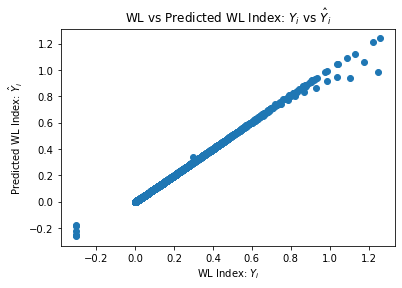

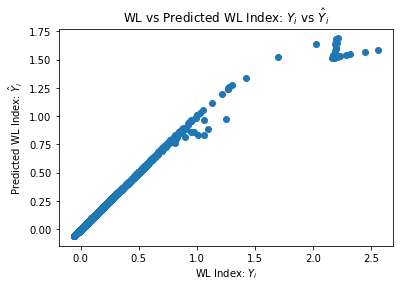

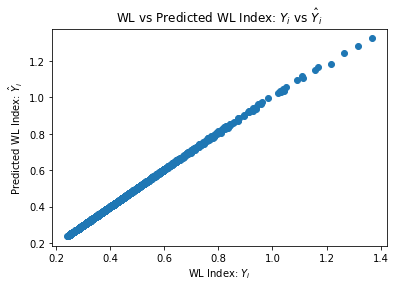

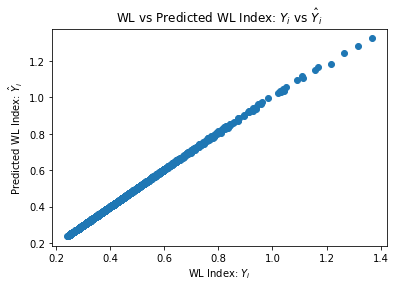

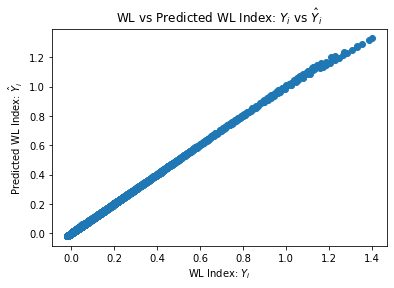

...

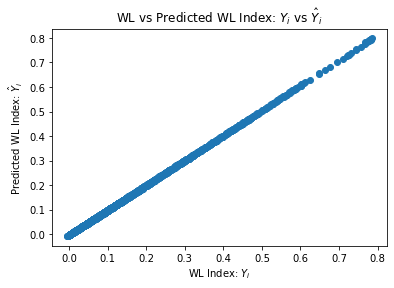

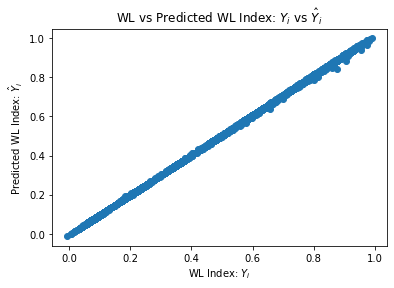

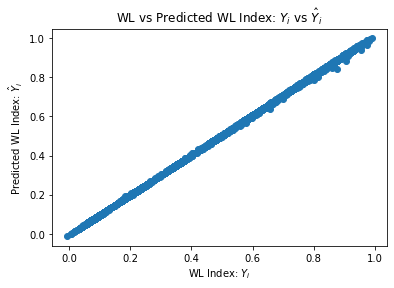

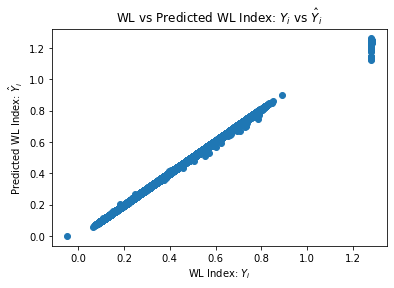

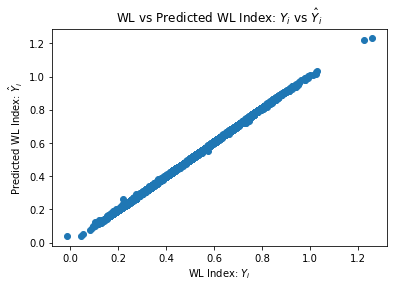

In [61]:
for i in range(len(df_list)):
    plt.scatter(y_test[i], y_pred[i])
    plt.xlabel("WL Index: $Y_i$")
    plt.ylabel("Predicted WL Index: $\hat{Y}_i$")
    plt.title("WL vs Predicted WL Index: $Y_i$ vs $\hat{Y}_i$")
    plt.show()

In [62]:
a_axis = [np.arange(0, len(y_train[i])) for i in range(len(df_list))]
b_axis = [np.arange(len(y_train[i]), len(y_train[i]) + len(y_pred[i])) for i in range(len(df_list))]

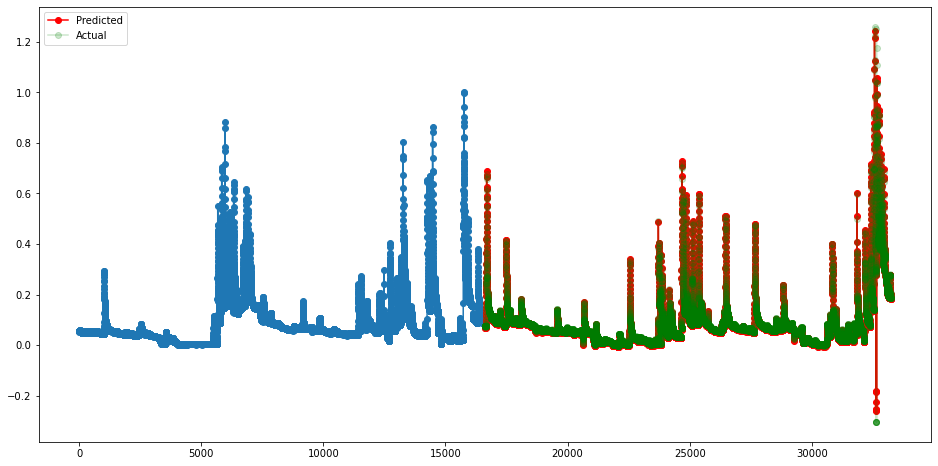

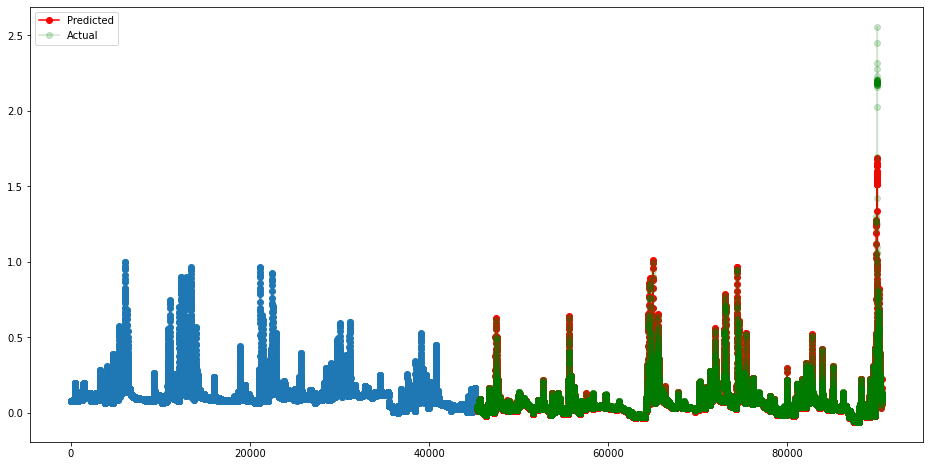

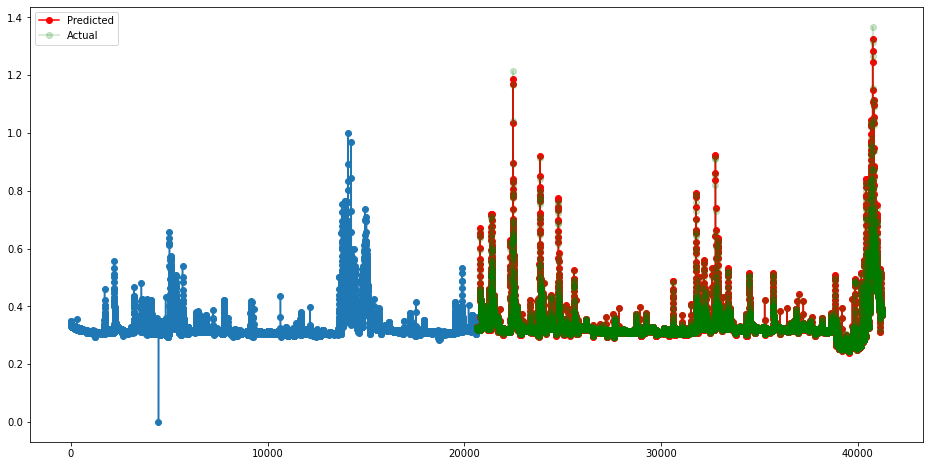

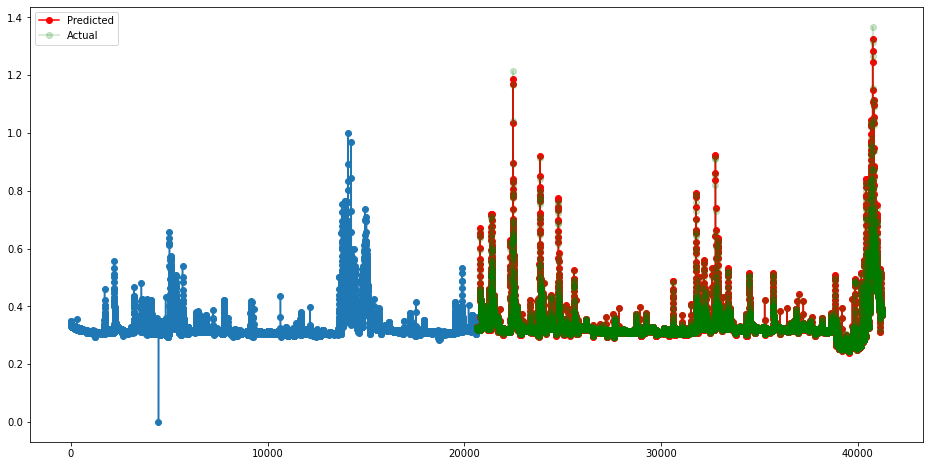

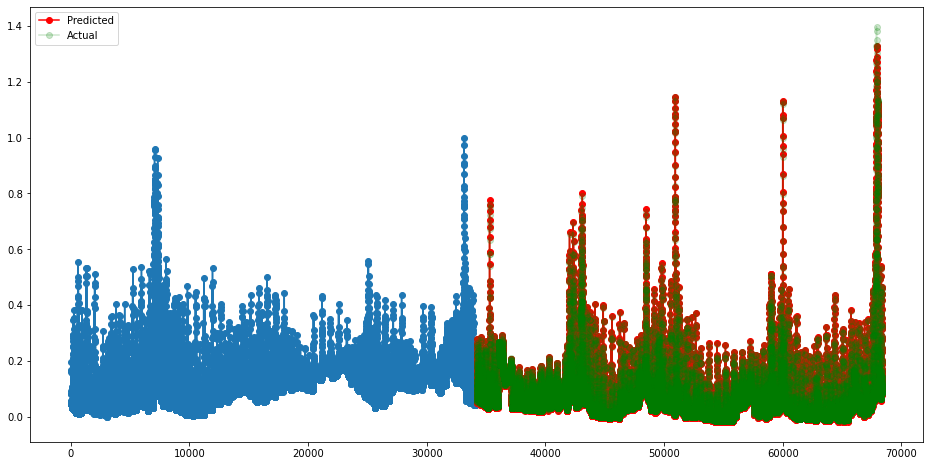

...

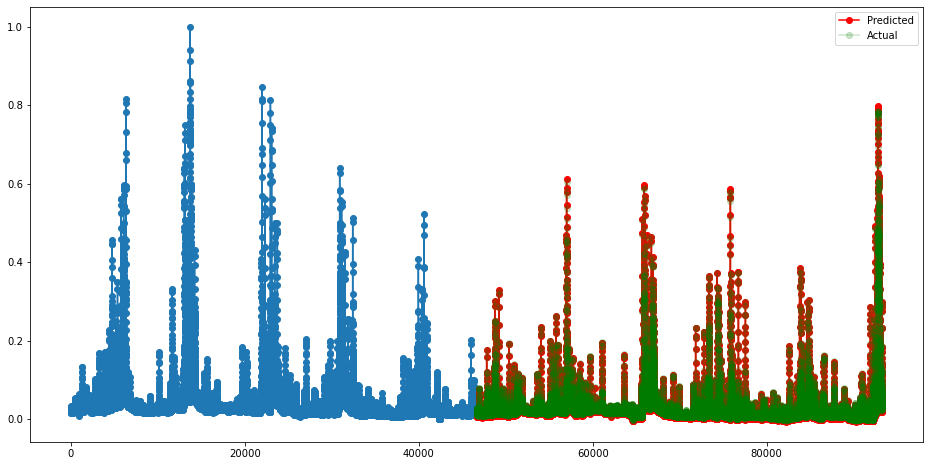

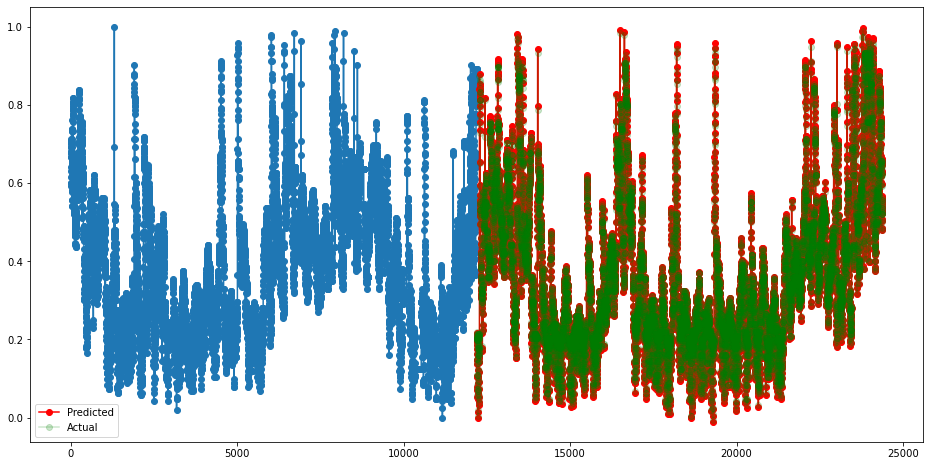

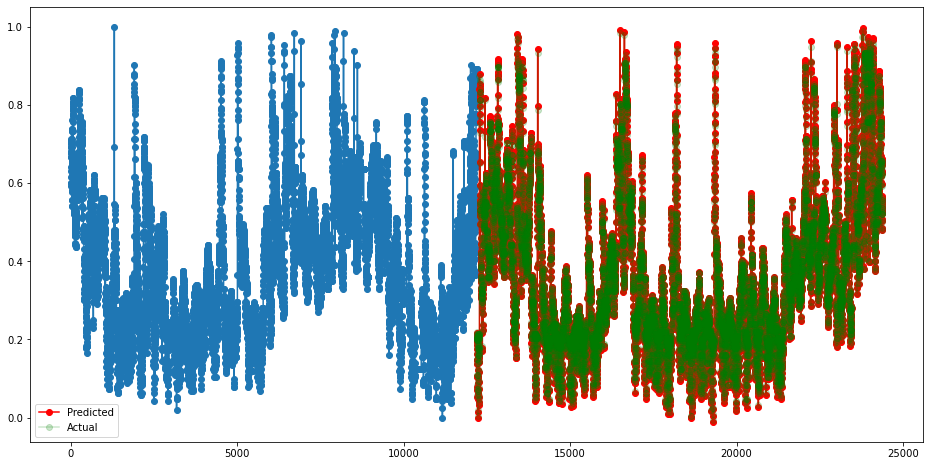

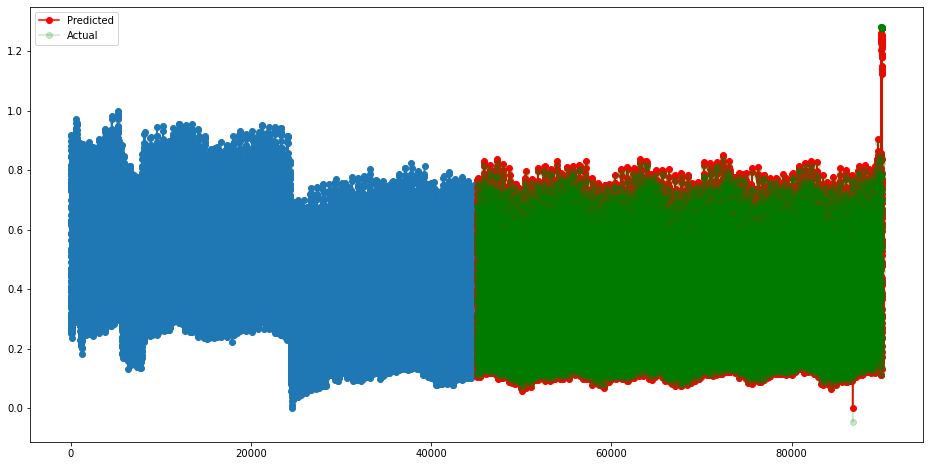

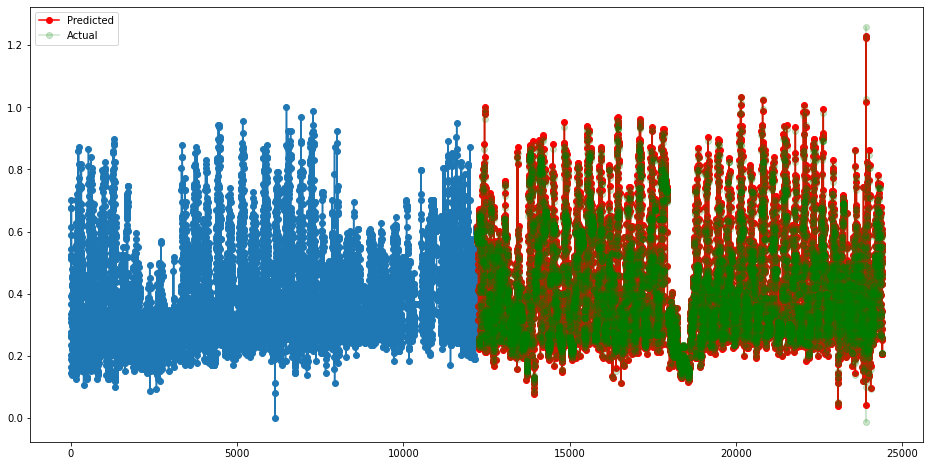

In [63]:
for i in range(len(df_list)):
    plt.figure(figsize=(16,8))
    plt.plot(a_axis[i], y_train[i].reshape(X_train_t[i].shape[0],), 'o-')
    plt.plot(b_axis[i], y_pred[i].reshape(X_test_t[i].shape[0],), 'o-', color='red', label='Predicted')
    plt.plot(b_axis[i], y_test[i].reshape(X_test_t[i].shape[0],), 'o-', color='green', alpha=0.2, label='Actual')
    plt.legend()
    plt.show()